## Distribution of metabolite data

Test each of the metabolite measurements for normality

In [2]:
# config opts and libraries
options(repr.plot.width = 6)
options(repr.plot.height = 5)
library(ggplot2);
library(plyr);
library(dplyr);
library(reshape2);
library(LSD);
library(qtl);
library(pheatmap);
library(funqtl);
library(parallel);
options(mc.cores = 24);
library(snow);
library(igraph);
library(stringr);
library(RColorBrewer);

In [83]:
# load data
endo_f = "/g/steinmetz/project/GenPhen/data/endometabolome/data/endometabolite_full_12102015.rda"
load(endo_f)
#head(endometabolite)

Since each timepoint per metabolite is tested separatley within the context of the rQTL analysis, I will test each separately for normality.

### Shapiro-Wilk test for normality

In [4]:
metabolite_normality = endometabolite %>% filter(., time_format == "relative") %>% 
    group_by(.,metabolite,time) %>% do({
        df = data.frame(
            metabolite = .$metabolite[1],
            time = .$time[1],
            value_shapriotest_pval = shapiro.test(.$value)$p.value,
            valuelog2_shapriotest_pval = shapiro.test(.$value.log2)$p.value
        )
        return(df)
        })

In [5]:
cutoff = 1e-2

In [81]:
# Fraction of raw metabolite measurements that are normally distributed
cat("Fraction of raw measurements indistinguishable from normal dist: ",
    sum(metabolite_normality$value_shapriotest_pval >= 1e-2) / dim(metabolite_normality)[1])

Fraction of raw measurements indistinguishable from normal dist:  0.03448276

In [82]:
# Fraction of log2 transformed metabolite measurements that are normally distributed
cat("Fraction of log2 transformed measurements indistinguishable from normal dist: ",
sum(metabolite_normality$valuelog2_shapriotest_pval >= 1e-2) / dim(metabolite_normality)[1])

Fraction of log2 transformed measurements indistinguishable from normal dist:  0.4741379

### Q-Q Plots

On Q-Q plot normally dist data should follow diagonal line

#### Raw Intensities

Warning message:
: Removed 1953 rows containing non-finite values (stat_qq).

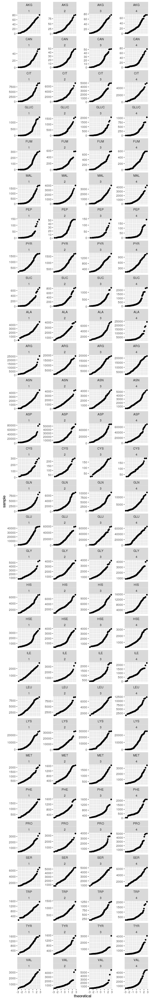

In [76]:
options(repr.plot.width = 6)
options(repr.plot.height = 40)
tmp = endometabolite %>% filter(., time_format == "relative")
p <- ggplot(tmp) + 
    stat_qq(aes(sample = value)) + 
    facet_wrap( metabolite ~ time, ncol = 4, scales = "free_y")
    #geom_abline(aes(intercept = 50, slope = max(value, na.rm = T)/6))
p

**Conclusion:** Many of the raw measurements deviate significantly from normality

#### Log2 Intensities

Warning message:
: Removed 1953 rows containing non-finite values (stat_qq).

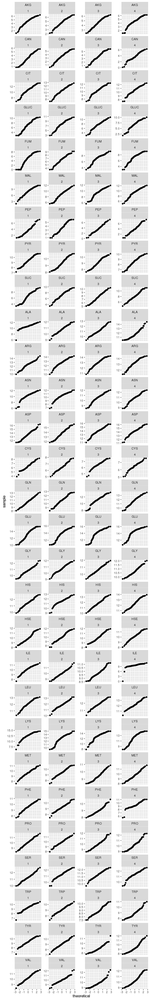

In [77]:
options(repr.plot.width = 6)
options(repr.plot.height = 40)
tmp = endometabolite %>% filter(., time_format == "relative")
p <- ggplot(tmp) + 
    stat_qq(aes(sample = value.log2)) + 
    facet_wrap( metabolite ~ time, ncol = 4, scales = "free_y")
    #geom_abline(aes(intercept = 50, slope = max(value, na.rm = T)/6))
p

**Conclusion:** Log2 measurements aare closer to normal dist